In [37]:
import json
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import pandas as pd
import os
import sys
module_path = os.path.abspath(os.path.join(os.pardir, os.pardir))
if module_path not in sys.path:
    sys.path.append(module_path)    
import pandas as pd
import nltk
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from nltk.tokenize import regexp_tokenize, word_tokenize, RegexpTokenizer
import matplotlib.pyplot as plt
import string
import re
import numpy as np
from nltk.tokenize import word_tokenize # nltk's gold standard word tokenizer
from nltk.tokenize import sent_tokenize # nltk's sentence tokenizer
from nltk.corpus import stopwords
import itertools
from nltk import WordNetLemmatizer # lemmatizer using WordNet
from nltk.corpus import wordnet # imports WordNet
from nltk import pos_tag # nltk's native part of speech tagging
import nltk
from itertools import chain
nltk.download("stopwords")
nltk.download('punkt') 
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/jalilsarwari/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/jalilsarwari/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/jalilsarwari/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/jalilsarwari/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [32]:
def pos_tagger(nltk_tag):
    if nltk_tag.startswith('J'):
        return wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return wordnet.VERB
    elif nltk_tag.startswith('N'):
        return wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return wordnet.ADV
    else:         
        return None

In [33]:
    
def first_step_normalizer(doc,stop_words):
    # filters for alphabetic (no punctuation or numbers) and filters out stop words. 
    # lower cases all tokens
    norm_text = []
    for x in word_tokenize(doc):
        if x.isalpha():
            x = x.lower()
        if x not in stop_words and '@' not in x:
            norm_text.append(x)
    return norm_text

In [60]:
def make_cloud(name):
    message = []

    # Opening JSON file
    filepath = 'user_data/' + name + '/' + name + '_messages.json'
    f = open(filepath)

    # returns JSON object as 
    # a dictionary
    data = json.load(f)

    # Iterating through the json
    # list
    for i in data:
        try:
            if i['media'] == None:
                message.append(i['message'])
        except:pass
    # Closing file
    f.close()

    corpus = [word_tokenize(doc) for doc in message]
    flattenedcorpus_tokens = pd.Series(list(itertools.chain(*corpus)))
    dictionary = pd.Series(
        flattenedcorpus_tokens.unique())
    stop_words = stopwords.words('english')
    new_words = ['u','ur',',','https',"'","i'm",'like','lol','get','one','http',
                "reeee","bro","need","tbh","ppl","wow","guy","dude","ye","okay","ik","ep",
                 "ya","plz","need","look","idk","c",'b','imo','smh','haha',"n't",
                '.first','wtf','ta','im']
                #'think','make','play','jalil','good','game','go']
    stop_words = stop_words + new_words
    token_norm = [first_step_normalizer(x,stop_words) for x in message]
    
    token_norm_tagged = [pos_tag(x) for x in token_norm]
    wordnet_tagged = []
    for sentence in token_norm_tagged:
        wordnet_tagged.append([(x[0], pos_tagger(x[1])) for x in sentence])
    flattened_wordnet_tagged =  list(chain.from_iterable(wordnet_tagged))
    wnl = WordNetLemmatizer()
    doc_lemmatized = [wnl.lemmatize(token, pos) for token, pos in flattened_wordnet_tagged if pos is not None]
    comment_words = ''
    

    # iterate through the csv file
    for val in doc_lemmatized:

        # typecaste each val to string
        val = str(val)

        # split the value
        tokens = val.split()

        # Converts each token into lowercase
        for i in range(len(tokens)):
            tokens[i] = tokens[i].lower()

        comment_words += " ".join(tokens)+" "
    wordcloud = WordCloud(width = 800, height = 800,
                    background_color ='white',
                    stopwords = stop_words,
                    min_font_size = 10).generate(comment_words)

    # plot the WordCloud image                      
    plt.figure(figsize = (20, 20), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title(name+"'s wordcloud'")
    plt.tight_layout(pad = 0)
    outfile = 'user_data/' + name + '/' + name + '_wordcloud'
    plt.savefig(outfile)
    plt.savefig(name)
    plt.show()

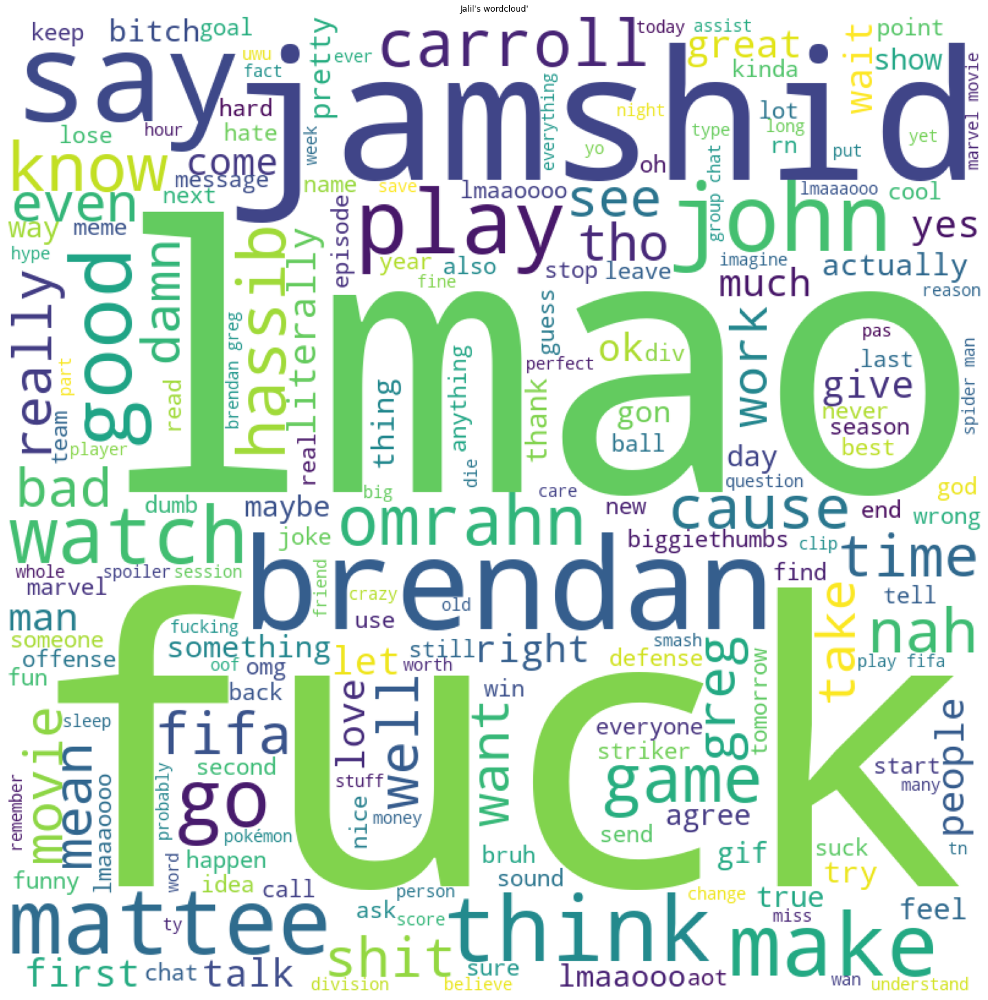

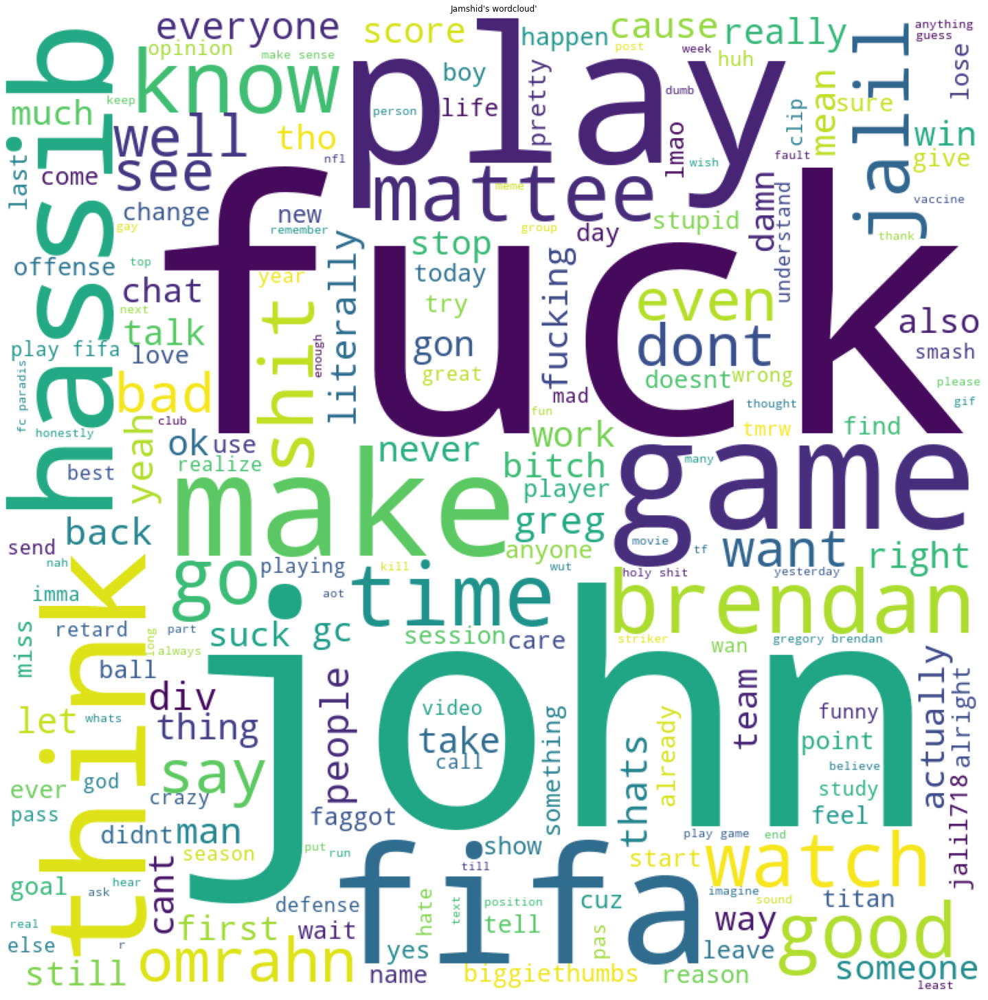

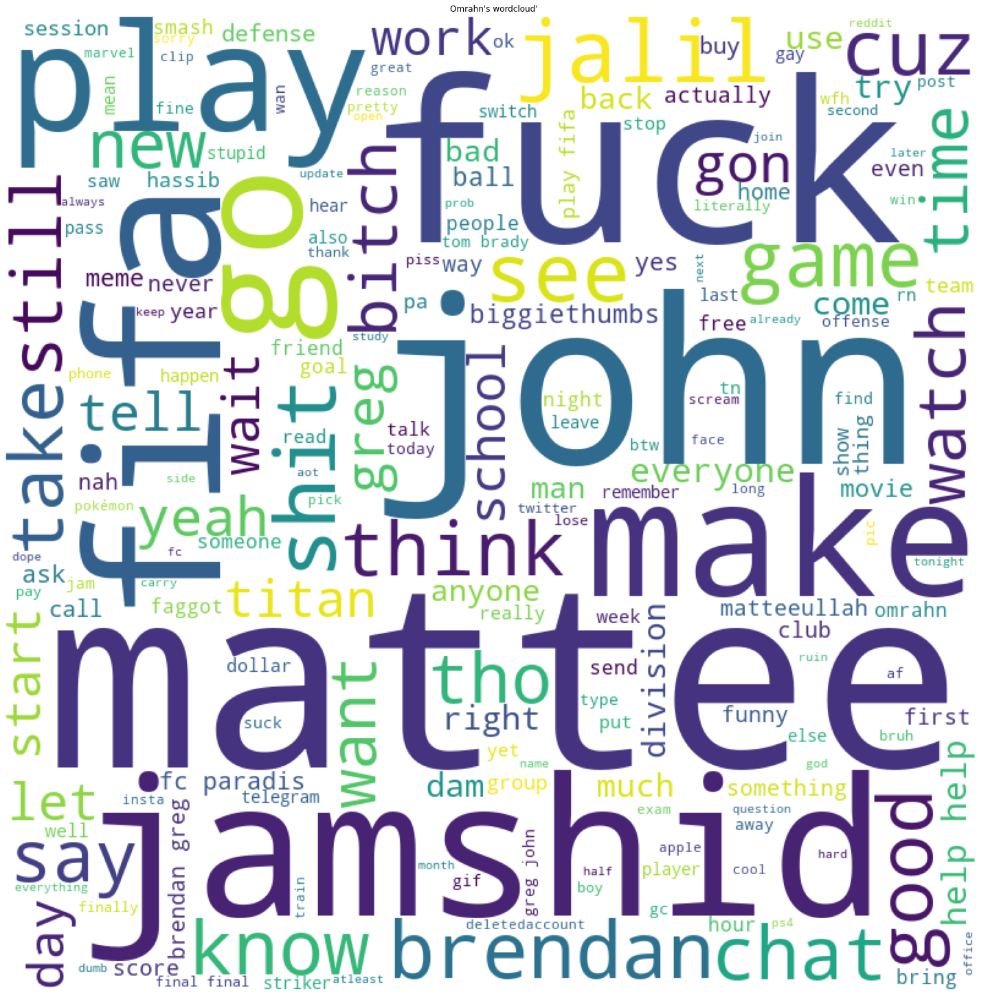

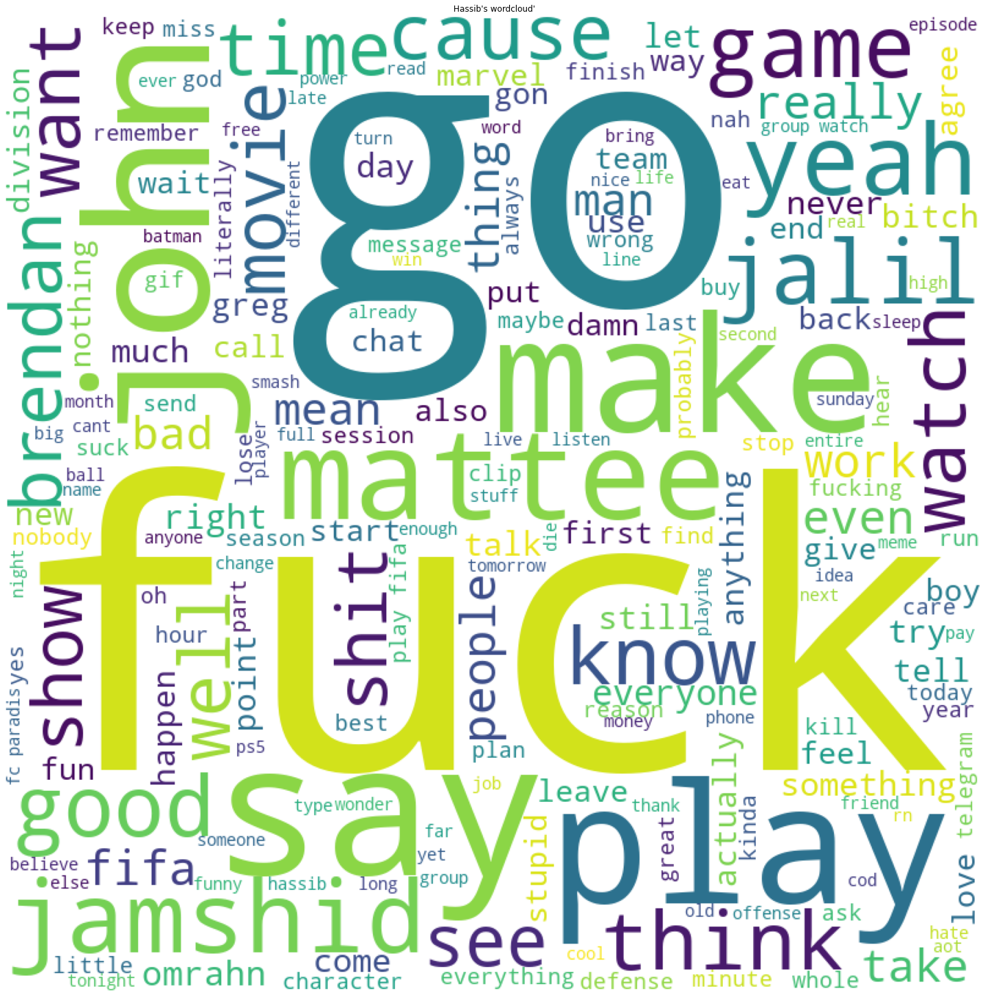

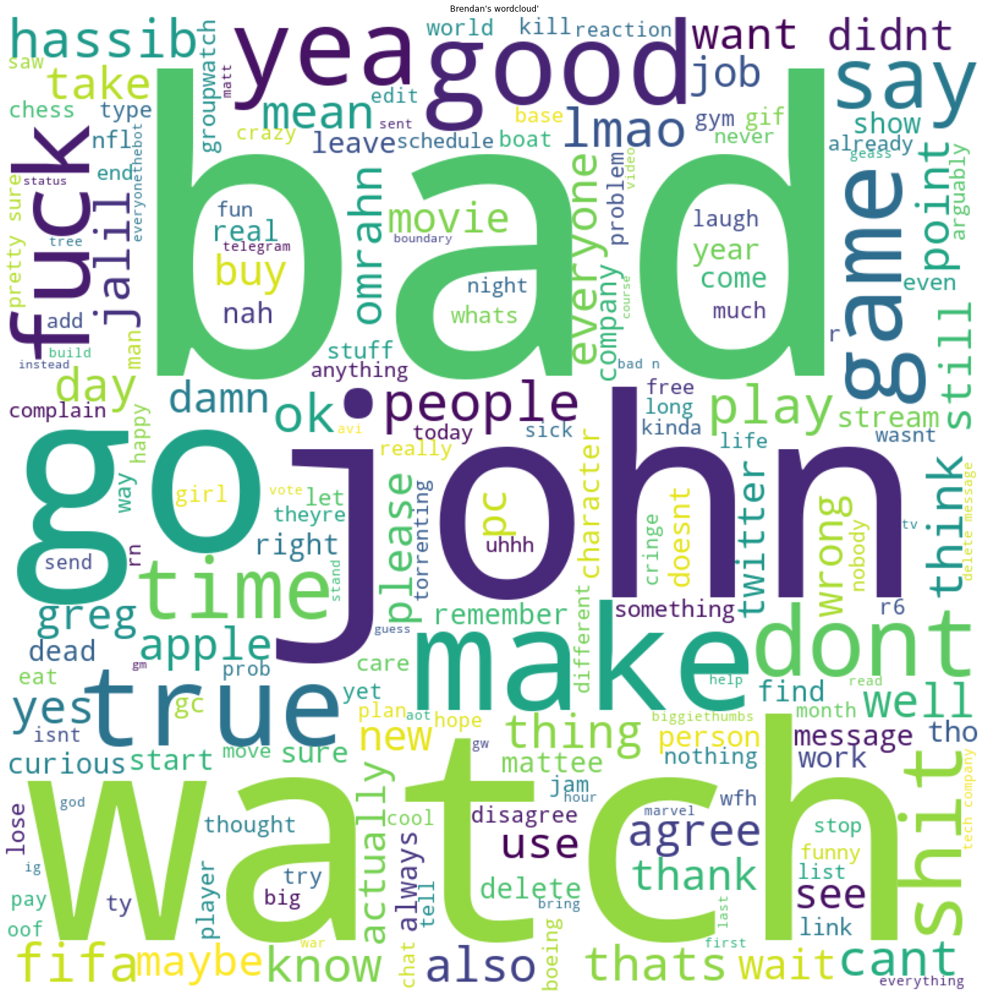

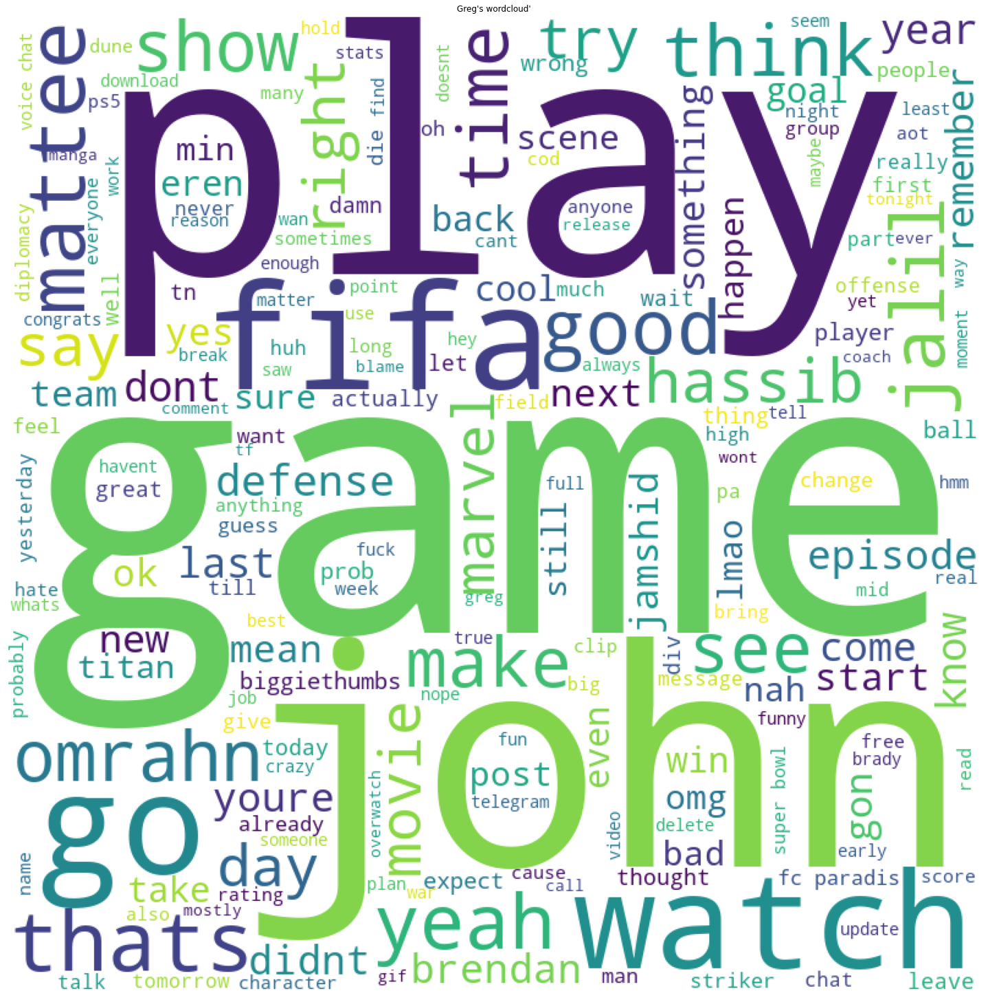

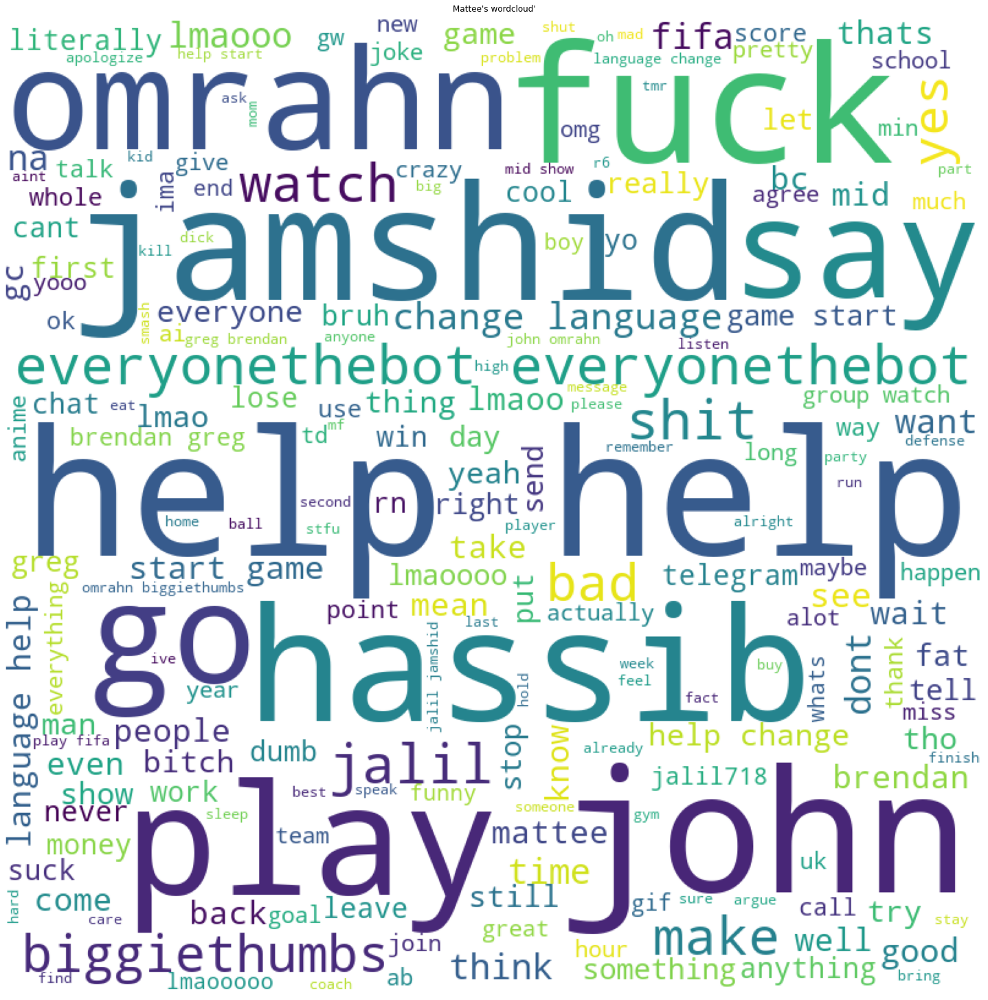

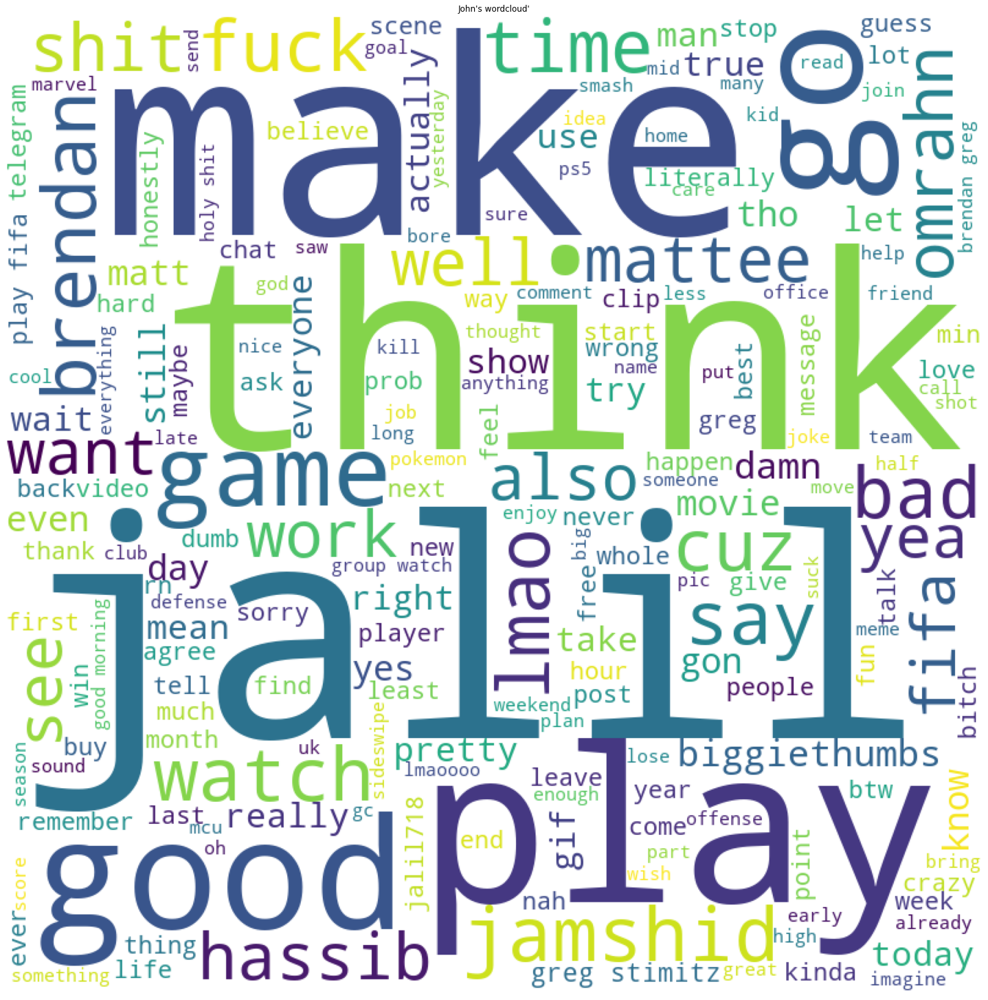

FileNotFoundError: [Errno 2] No such file or directory: 'user_data/channel_messages/channel_messages_messages.json'

In [61]:
names = ['Jalil','Jamshid','Omrahn','Hassib','Brendan','Greg','Mattee','John','channel_messages']
for x in names:    
    make_cloud(x)